In [1]:
from PIL import Image
import os
import cv2
import pandas as pd

def calculate_image_stats(image_path):
    # Vérifier si le fichier est une image
    image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tif']
    if not any(image_path.lower().endswith(ext) for ext in image_extensions):
        print(f"Ignoré le fichier non pris en charge : {image_path}")
        return None

    # Charger l'image
    img = cv2.imread(image_path)

    if img is None:
        print(f"Erreur de lecture de l'image : {image_path}")
        return None

    # Obtenir les dimensions de l'image (hauteur et largeur)
    height, width, _ = img.shape

    # Obtenir le format à partir de l'extension du fichier
    img_format = os.path.splitext(image_path)[1]

    # Convertir l'image en niveaux de gris
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Calculer la luminosité moyenne
    mean_brightness = gray.mean()
    
    # Convertir l'image en espace de couleur HSV
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    # Extraire la composante de teinte (Hue)
    hue = hsv_img[:, :, 0]
    # Calculer la teinte moyenne
    mean_hue = hue.mean()

    return  height, width, img_format, mean_brightness, mean_hue

def create_dataframe(root_dir):
    data = []

    for root, dirs, files in os.walk(root_dir):
        for file in files:
            img_path = os.path.join(root, file)
            image_stats = calculate_image_stats(img_path)

            if image_stats:
                # Extraire le type de diapositive (Signed ou Unsigned)
                slides_type = "Signed slides" if "Signed slides" in img_path else "Unsigned slides"
                # Extraire la classe de cellule à partir du chemin
                parts = img_path.split(os.sep)
                cell_type = ""
                if "Signed slides" in parts:
                    cell_type_index = parts.index("Signed slides") + 1
                    if cell_type_index < len(parts):
                        cell_type = parts[cell_type_index]

                 # Extraire le nom du patient du chemin
                patient = None
                for part in parts:
                    if part.startswith("Patient_"):
                        patient = part
                        break

                data.append([img_path, patient, slides_type, cell_type] + list(image_stats))

    df = pd.DataFrame(data, columns=['img_path', 'patient', 'slides_type', 'cell_type', 'height', 'width', 'format', 'mean_brightness', 'mean_hue'])
    return df

root_directory = "Acute_Promyelocytic_Leukemia_APL"
df = create_dataframe(root_directory)

# Afficher le DataFrame
print(df.head())


Ignoré le fichier non pris en charge : Acute_Promyelocytic_Leukemia_APL\master.csv
Ignoré le fichier non pris en charge : Acute_Promyelocytic_Leukemia_APL\All\All\Patient_00\Signed slides\Blast, no lineage spec\Thumbs.db
Ignoré le fichier non pris en charge : Acute_Promyelocytic_Leukemia_APL\All\All\Patient_00\Signed slides\Eosinophils\Thumbs.db
Ignoré le fichier non pris en charge : Acute_Promyelocytic_Leukemia_APL\All\All\Patient_00\Signed slides\Erythroblast\Thumbs.db
Ignoré le fichier non pris en charge : Acute_Promyelocytic_Leukemia_APL\All\All\Patient_00\Signed slides\Giant thrombocyte\Thumbs.db
Ignoré le fichier non pris en charge : Acute_Promyelocytic_Leukemia_APL\All\All\Patient_00\Signed slides\Lymphocyte\Thumbs.db
Ignoré le fichier non pris en charge : Acute_Promyelocytic_Leukemia_APL\All\All\Patient_01\Signed slides\Blast, no lineage spec\Thumbs.db
Ignoré le fichier non pris en charge : Acute_Promyelocytic_Leukemia_APL\All\All\Patient_01\Signed slides\Erythroblast\Thumbs.db

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25721 entries, 0 to 25720
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   img_path         25721 non-null  object 
 1   patient          25721 non-null  object 
 2   slides_type      25721 non-null  object 
 3   cell_type        25721 non-null  object 
 4   height           25721 non-null  int64  
 5   width            25721 non-null  int64  
 6   format           25721 non-null  object 
 7   mean_brightness  25721 non-null  float64
 8   mean_hue         25721 non-null  float64
dtypes: float64(2), int64(2), object(5)
memory usage: 1.8+ MB


In [3]:
df['slides_type'].value_counts()

slides_type
Signed slides      15632
Unsigned slides    10089
Name: count, dtype: int64

In [6]:
df['cell_type'].value_counts()

cell_type
Lymphocyte                 3435
Blast, no lineage spec     3310
Smudge cells               2931
Segmented neutrophils      2092
Monocyte                   1319
Promyelocyte                688
Erythroblast                521
Lymphocyte, variant         471
Myelocyte                   181
Band neutrophils            171
Eosinophils                 108
Metamyelocyte                78
Promonocyte                  71
Giant thrombocyte            66
Plasma cells                 58
Basophil                     53
Arifact                      25
Unidentified                 24
Thrombocyte aggregation      22
Young Unidentified            7
Prolymphocyte                 1
Name: count, dtype: int64

In [ ]:
import pandas as pd

# Supposons que votre DataFrame s'appelle df
valeurs_a_supprimer = ['Arifact', 'Unidentified', 'Thrombocyte aggregation', 'Young Unidentified', 'Prolymphocyte',
                      'Lymphocyte, variant', 'Smudge cells', 'Bans neutrophils' ]

# Utilisez la méthode isin pour sélectionner les lignes à conserver
df = df[~df['cell_type'].isin(valeurs_a_supprimer)]


,Diagnosis,Cohort,Age at Diagnosis,Gender
Patient_ID,,,,
Patient_00,APL,Discovery,29,Female
Patient_01,AML,Discovery,28,Male
Patient_02,AML,Discovery,29,Female
Patient_03,AML,Discovery,32,Female
Patient_04,AML,Discovery,62,Female


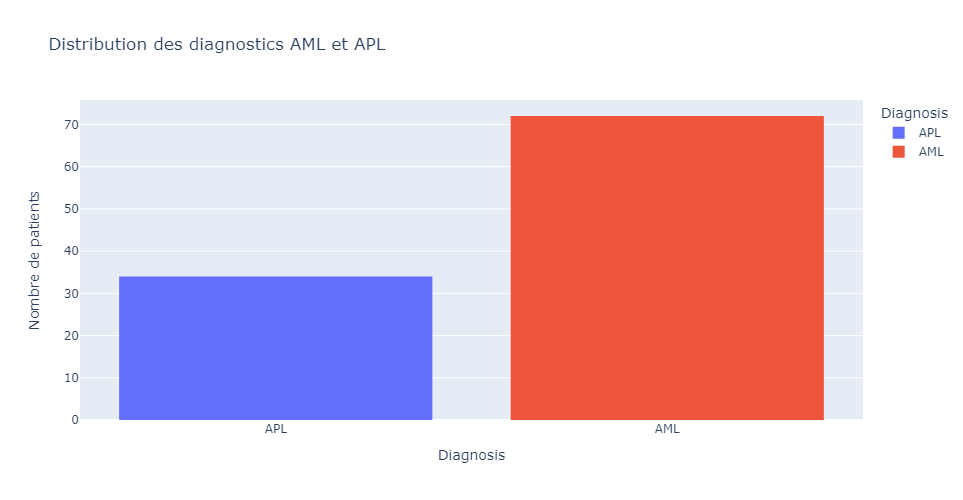

In [16]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

# Tâche 1 : Charger le fichier CSV 'master' et afficher la distribution des diagnosis
csv_file_path = 'Acute_Promyelocytic_Leukemia_APL/master.csv'
df_master = pd.read_csv(csv_file_path, index_col=0)
display(df_master.head())

fig = px.histogram(df_master, x='Diagnosis', color='Diagnosis', title='Distribution des diagnostics AML et APL')
fig.update_layout(xaxis_title='Diagnosis', yaxis_title='Nombre de patients',  width=800, height=500)
fig.show()



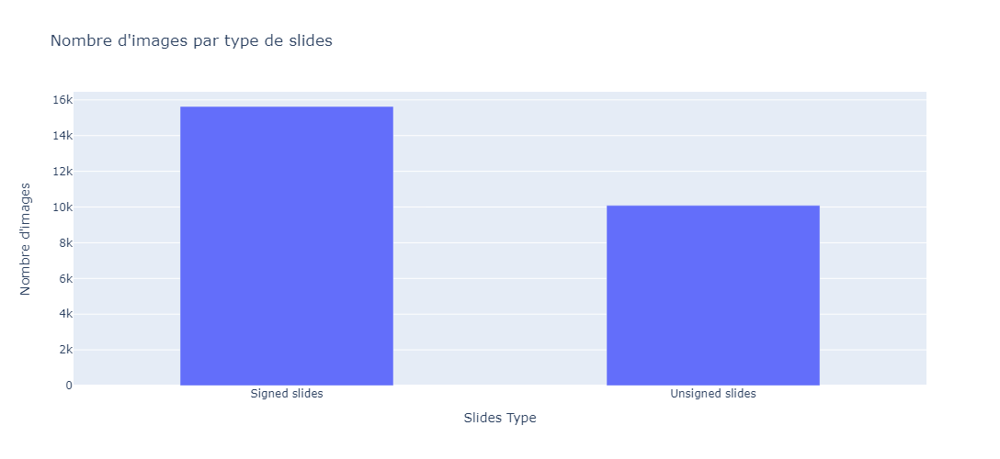

In [19]:
import plotly.express as px

# Compter le nombre d'images pour chaque 'slides_type'
slides_type_counts = df['slides_type'].value_counts().reset_index()
slides_type_counts.columns = ['slides_type', 'count']

# Créer un graphique interactif en barres
fig = px.bar(slides_type_counts, x='slides_type', y='count', title="Nombre d'images par type de slides",
             labels={'slides_type': 'Slides Type', 'count': "Nombre d'images"})
fig.update_layout(width=600, height=500, bargap=0.5)
# Afficher le graphique interactif
fig.show()


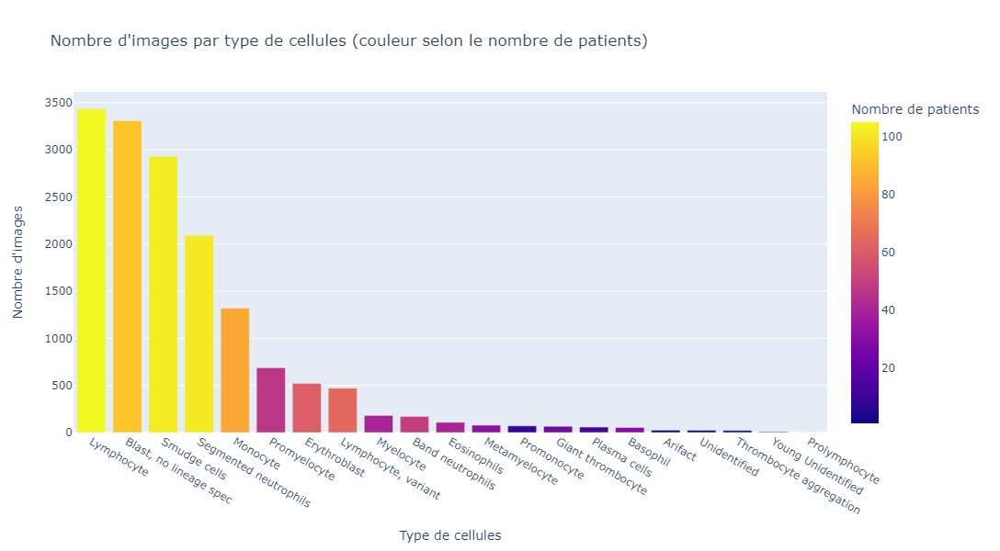

In [32]:
# Filtrer le DataFrame pour ne conserver que les données des "Signed slides"
signed_slides_df = df[df['slides_type'] == 'Signed slides']

# Compter le nombre de patients pour chaque type de cellule
patient_counts = signed_slides_df.groupby(['cell_type'])['patient'].nunique().reset_index()
patient_counts.columns = ['cell_type', 'patient_count']

# Compter le nombre d'images pour chaque type de cellule
image_counts = signed_slides_df.groupby(['cell_type'])['img_path'].count().reset_index()
image_counts.columns = ['cell_type', 'image_count']

# Fusionner les deux DataFrames pour avoir le nombre de patients et d'images par type de cellules
merged_df = patient_counts.merge(image_counts, on='cell_type')

# Trier le DataFrame en fonction du nombre d'images (en ordre décroissant)
merged_df = merged_df.sort_values(by='image_count', ascending=False)

# Créer un graphique interactif en barres
fig = px.bar(merged_df, x='cell_type', y='image_count', color='patient_count',
             title="Nombre d'images par type de cellules (couleur selon le nombre de patients)",
             labels={'cell_type': "Type de cellules", 'image_count': "Nombre d'images", 'patient_count': "Nombre de patients"})
fig.update_layout(width=1000, height=600)

# Afficher le graphique interactif
fig.show()




In [35]:
# Filtrer le DataFrame pour ne conserver que les lignes avec 'Giant thrombocyte' comme 'cell_type'
patients_with_thrombocyte_aggregation = df[df['cell_type'] == 'Giant thrombocyte']

# Afficher les patients ayant 'Giant thrombocyte'
print(patients_with_thrombocyte_aggregation['patient'].unique())


['Patient_00' 'Patient_02' 'Patient_08' 'Patient_100' 'Patient_101'
 'Patient_104' 'Patient_14' 'Patient_15' 'Patient_18' 'Patient_20'
 'Patient_39' 'Patient_40' 'Patient_41' 'Patient_58' 'Patient_59'
 'Patient_60' 'Patient_61' 'Patient_62' 'Patient_68' 'Patient_75'
 'Patient_85' 'Patient_88' 'Patient_89' 'Patient_91' 'Patient_97'
 'Patient_99']


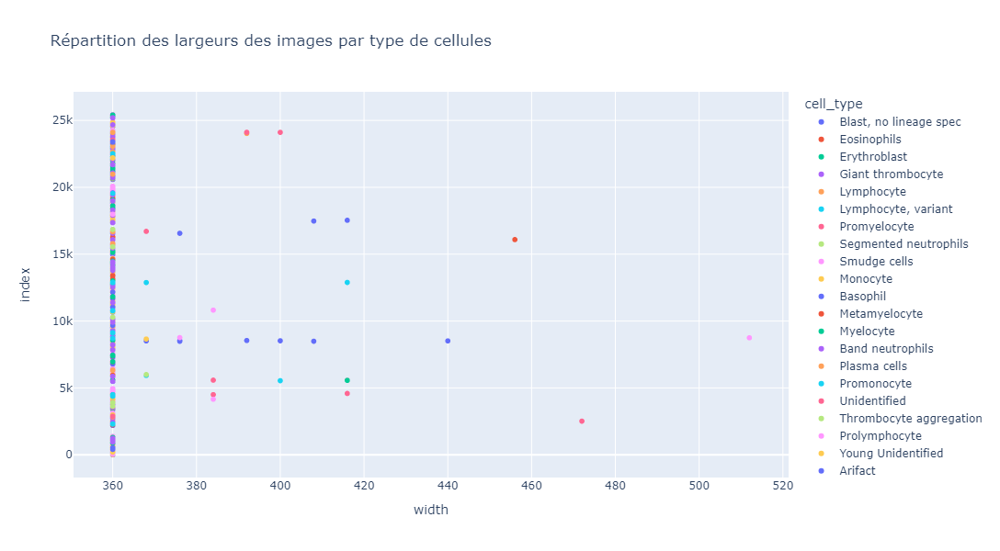

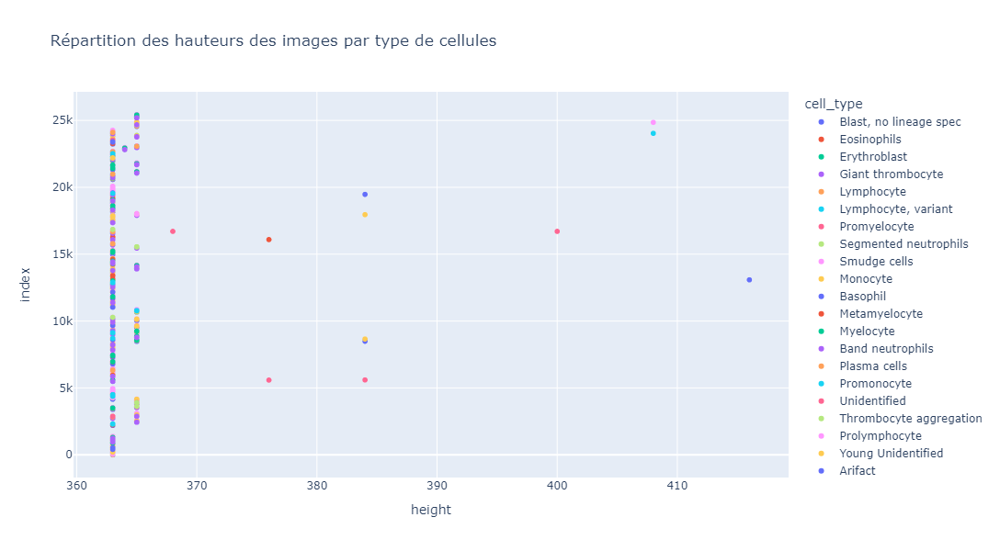

In [93]:
# Créer un scatter plot interactif pour la largeur (width) en différenciant par le dataset
fig_width = px.scatter(signed_slides_df, x='width', color='cell_type', title="Répartition des largeurs des images par type de cellules")

# Créer un scatter plot interactif pour la hauteur (height) en différenciant par le dataset
fig_height = px.scatter(signed_slides_df, x='height', color='cell_type', title="Répartition des hauteurs des images par type de cellules")

fig_width.update_layout(width=600, height=600)
fig_height.update_layout(width=600, height=600)
fig_width.show()
fig_height.show()

In [97]:
df.loc[2517]['img_path']

'Acute_Promyelocytic_Leukemia_APL\\All\\All\\Patient_10\\Signed slides\\Promyelocyte\\PMY_15495842.jpg'

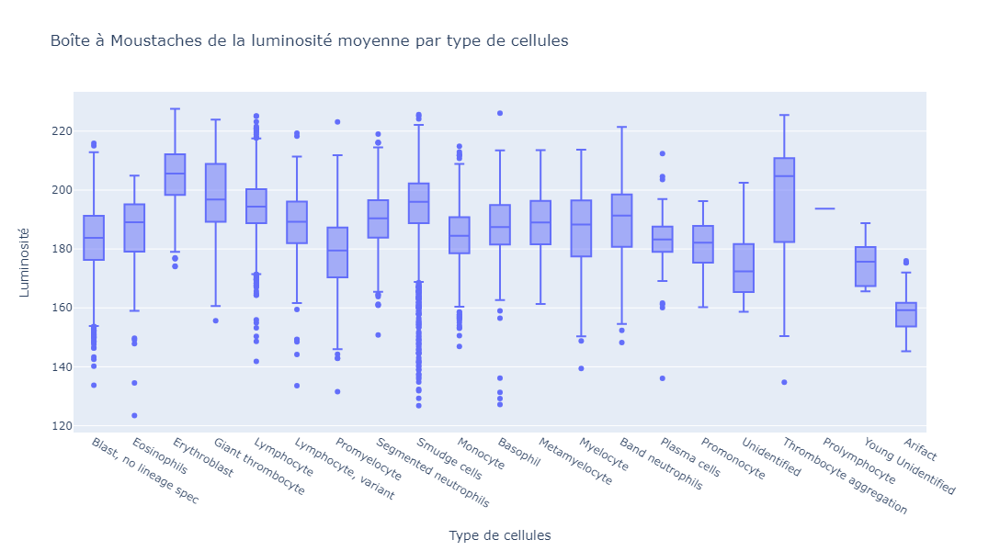

In [92]:
import plotly.express as px

# Créez un graphique interactif de boîte (box plot) pour la luminosité en fonction du type de cellules
fig_box = px.box(signed_slides_df, x='cell_type', y='mean_brightness', title="Boîte à Moustaches de la luminosité moyenne par type de cellules",
                labels={'mean_brightness': 'Luminosité', 'cell_type': 'Type de cellules'},
                hover_data=['img_path'])  # Ajoutez 'img_path' à hover_data

# Mettez à jour la taille du graphique
fig_box.update_layout(width=900, height=600)

# Affichez le graphique interactif de la boîte à moustaches
fig_box.show()

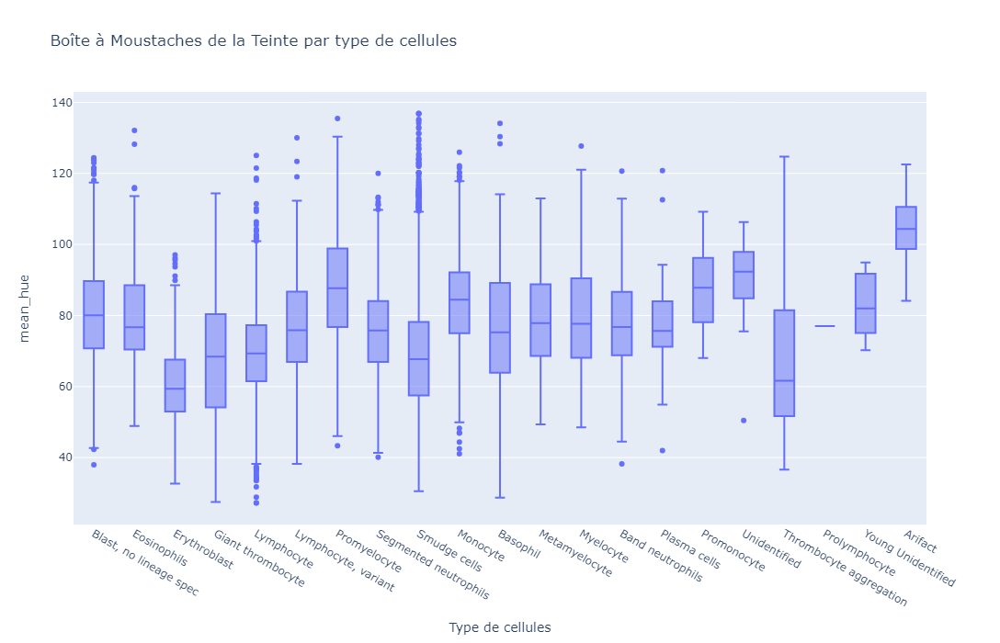

In [69]:
import plotly.express as px

# Créez un graphique interactif de boîte (box plot) pour la teinte en fonction du dataset
fig_box = px.box(signed_slides_df, x='cell_type', y='mean_hue', title="Boîte à Moustaches de la Teinte par type de cellules",
                labels={'mean_brightness': 'Teinte', 'cell_type': 'Type de cellules'},
                hover_data=['img_path'])  # Ajoutez 'img_path' à hover_data

# Mettez à jour la taille du graphique
fig_box.update_layout(width=1000, height=700)

# Affichez le graphique interactif de la boîte à moustaches
fig_box.show()

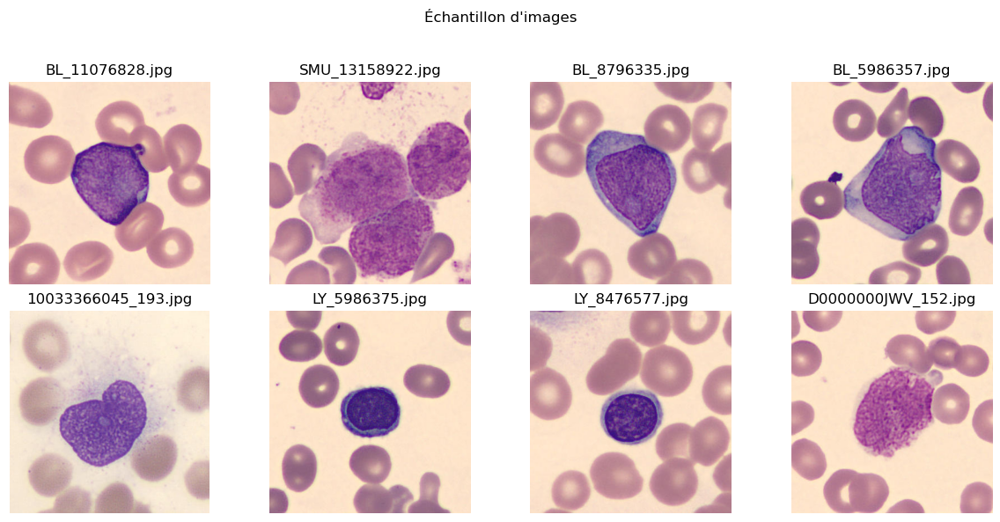

In [75]:
import matplotlib.pyplot as plt
from matplotlib.image import imread
import os

# Sélectionnez un échantillon aléatoire de 8 chemins d'accès aux images depuis le DataFrame
sample_df = df.sample(8)

# Créez une disposition de sous-graphiques 2x4
fig, axs = plt.subplots(2, 4, figsize=(12, 6))
fig.suptitle("Échantillon d'images")

# Affichez chaque image dans un sous-graphique
for i in range(8):  # Utilisez une boucle sur l'index de l'échantillon
    path = sample_df.iloc[i]['img_path']  # Sélectionnez le chemin depuis l'échantillon
    img = imread(path)
    row = i // 4  # Calcule la ligne
    col = i % 4   # Calcule la colonne
    axs[row, col].imshow(img)
    
    # Utilisez la fin de l'img_path comme titre
    title = os.path.basename(path)
    axs[row, col].set_title(title)
    axs[row, col].axis('off')

# Ajustez l'espacement entre les sous-graphiques
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Affichez le résultat
plt.show()



